# Multiframe imaging pipeline
Merging multiple images is an effective way to reduce noise. This assignment provides several sets of multi-frame raw images and asks to develop a fusion pipeline to reduce noise as much as possible.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from multiframe.utils import open_image_stack
from multiframe.pipeline import simple_isp

## Image settings

In [2]:
image_height = 3000
image_width = 4000
bayer_pattern = 'rggb'
bitdepth = 10
wb_method = 'manual'

metadata = {}
metadata['tripod'] = {'bright': {}, 'dark': {}}
metadata['handheld'] = {'bright': {}, 'dark': {}}
metadata['tripod']['bright']['wb'] = [1.639096, 1.000000, 2.015699]
metadata['tripod']['dark']['wb'] = [1.361160, 1.000000, 2.138799]
metadata['tripod']['bright']['ccm'] = [[1.648438, -0.593750, -0.054688],
                                       [-0.281250, 1.445312, -0.164062],
                                       [0.054688, -0.664062, 1.609375]]
metadata['tripod']['dark']['ccm'] = [[1.570312, -0.507812, -0.062500],
                                     [-0.250000, 1.398438, -0.148438],
                                     [0.031250, -0.710938, 1.679688]]
metadata['tripod']['bright']['iso'] = 1808
metadata['tripod']['dark']['iso'] = 12800
metadata['tripod']['bright']['exp'] = 80000000
metadata['tripod']['dark']['exp'] = 124250060
metadata['tripod']['bright']['bl'] = 64
metadata['tripod']['dark']['bl'] = 64

metadata['handheld']['bright']['wb'] = [1.193530, 1.000000, 2.553545]
metadata['handheld']['dark']['wb'] = [1.322424, 1.000000, 2.159700]
metadata['handheld']['bright']['ccm'] = [[1.578125, -0.492188, -0.085938],
                                         [-0.257812, 1.398438, -0.140625],
                                         [0.000000, -0.890625, 1.890625]]
metadata['handheld']['dark']['ccm'] = [[1.562500, -0.500000, -0.070312],
                                       [-0.250000, 1.390625, -0.140625],
                                       [0.023438, -0.750000, 1.726562]]
metadata['handheld']['bright']['iso'] = 2290
metadata['handheld']['dark']['iso'] = 12800
metadata['handheld']['bright']['exp'] = 80000000
metadata['handheld']['dark']['exp'] = 124250060
metadata['handheld']['bright']['bl'] = 64
metadata['handheld']['dark']['bl'] = 64

## Task 1
The images in folder “Scene1_tripod” are taken using a tripod. There are two sub-folders: one taken in bright illumination, and the other taken in low-light illumination. Please develop algorithms to merge the given 8 frames in each sub-folder and output final RGB image.

The image size is 4000 x 3000 and the raw format is “mipi raw”. You can find other parameters in the txt file in corresponding sub-folders.

There is a down-sized image in the folder to show what the scene is.

### Simple temporal denoising
The advantage of having an image stack is that we can reduce temporal noise by averaging the different images if they are properly aligned (as we can assume from the fact that a tripod is used).

In this task, we will then focus on this type of temporal denoising without any motion compensation. We won't apply any extra type of (2D) spatial denoising as methods for this are well known (e.g., the bilateral filter, Non-Local Means, etc.) and can reduce the level of details, particularly in areas with high frequency textures. State-of-the-art results are nowadays obtained using deep learning: http://openaccess.thecvf.com/content_CVPRW_2019/papers/NTIRE/Liu_Learning_Raw_Image_Denoising_With_Bayer_Pattern_Unification_and_Bayer_CVPRW_2019_paper.pdf 

In [3]:
motion_comp = False  # This sets up simple temporal denoising

#### Bright conditions

Text(0.5, 1.0, 'Single frame')

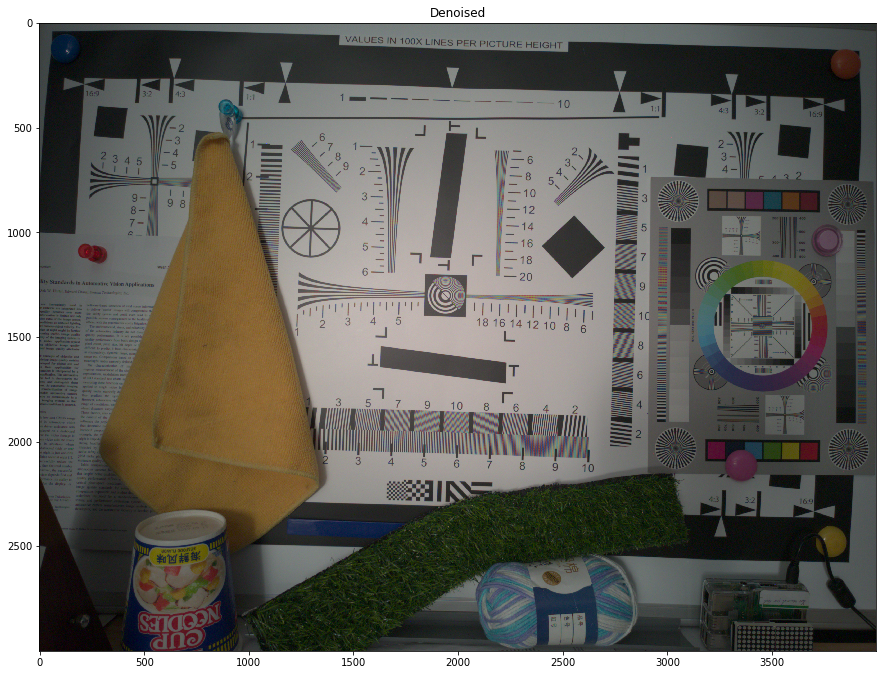

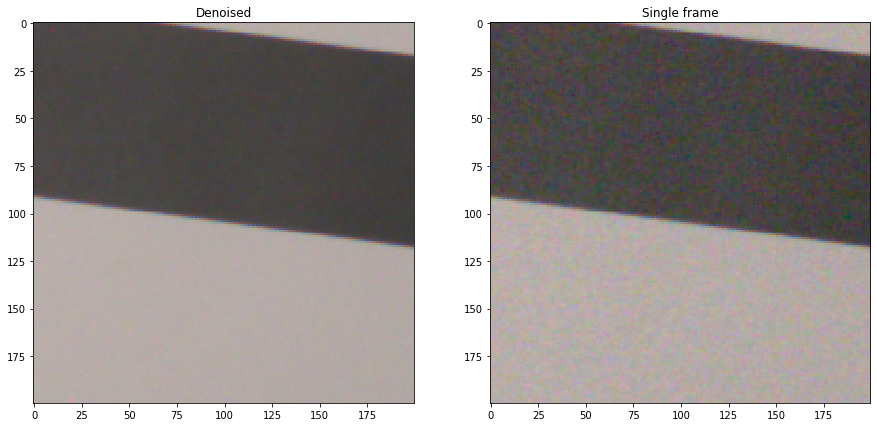

In [4]:
# Stack
image_folder = '../images/Scene1_tripod/Scene1_Bright/'
wb_gains = np.array(metadata['tripod']['bright']['wb'])
bl = metadata['tripod']['bright']['bl']
ccm = np.array(metadata['tripod']['bright']['ccm'])
img_stack = open_image_stack(image_folder, image_height, image_width)
rgb_stack = simple_isp(img_stack, motion_comp, bitdepth, bayer_pattern, bl, ccm, wb_method, wb_gains)

# Single capture
rgb_single = simple_isp(img_stack[:, :, 0], motion_comp, bitdepth, bayer_pattern, bl, ccm, wb_method, wb_gains)

# Show the result
plt.figure(figsize = (15,15))
plt.imshow(rgb_stack)
plt.title('Denoised')

# Crop
idx = [1600, 1800, 2000, 2200]
plt.figure(figsize = (15,15))
plt.subplot(121)
plt.imshow(rgb_stack[idx[0]:idx[1], idx[2]:idx[3], :])
plt.title('Denoised')
plt.subplot(122)
plt.imshow(rgb_single[idx[0]:idx[1], idx[2]:idx[3], :])
plt.title('Single frame')

#### Dark conditions

Text(0.5, 1.0, 'Single frame')

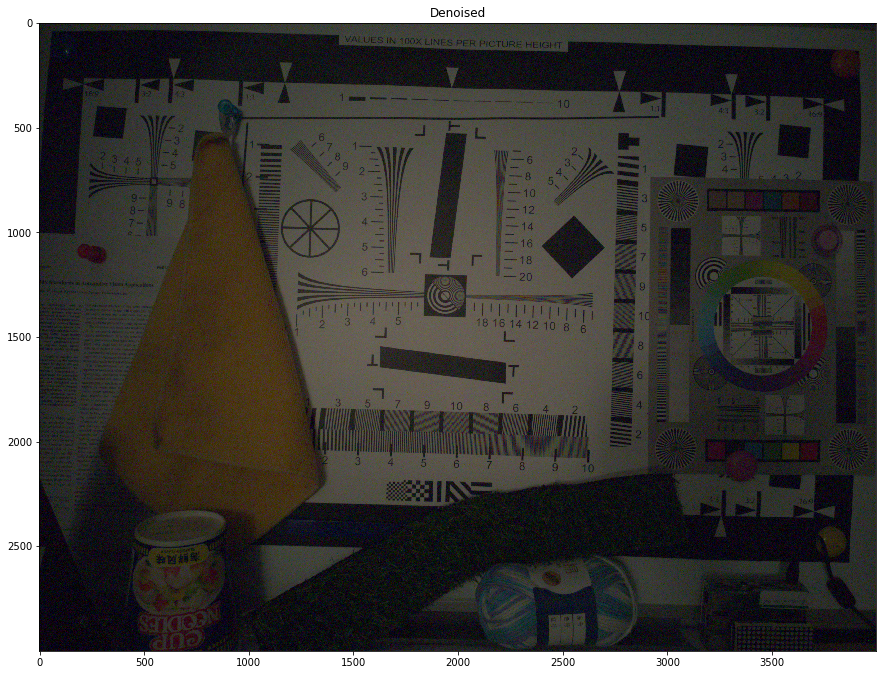

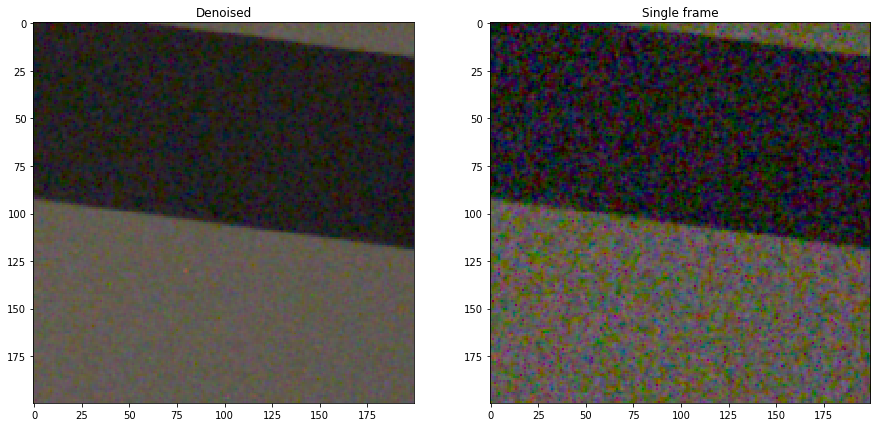

In [5]:
# Stack
image_folder = '../images/Scene1_tripod/Scene1_Dark/'
wb_gains = np.array(metadata['tripod']['dark']['wb'])
bl = metadata['tripod']['dark']['bl']
ccm = np.array(metadata['tripod']['dark']['ccm'])
img_stack = open_image_stack(image_folder, image_height, image_width)
rgb_stack = simple_isp(img_stack, motion_comp, bitdepth, bayer_pattern, bl, ccm, wb_method, wb_gains)

# Single capture
rgb_single = simple_isp(img_stack[:, :, 0], motion_comp, bitdepth, bayer_pattern, bl, ccm, wb_method, wb_gains)

# Show the result
plt.figure(figsize = (15,15))
plt.imshow(rgb_stack)
plt.title('Denoised')

# Crop
idx = [1600, 1800, 2000, 2200]
plt.figure(figsize = (15,15))
plt.subplot(121)
plt.imshow(rgb_stack[idx[0]:idx[1], idx[2]:idx[3], :])
plt.title('Denoised')
plt.subplot(122)
plt.imshow(rgb_single[idx[0]:idx[1], idx[2]:idx[3], :])
plt.title('Single frame')

## Task 2
The images in folder “Scene2_handheld” are similar as Task 1 but the camera is held on hand.
Improve your algorithms to deal with this case.

### Temporal denoising with motion compensation
When we are capturing images with a handheld camera, there is a high chance that the different frames will not be correctly aligned due to camera shake. This global motion is easy to correct if we constrain the movement to a vertical and horizontal shift. This approach is more computationally efficient and hardware friendly than using other methods that rely on detecting features and finding a homography.

The algorithm used is called Median Threshold Bitmap (MTB) and it converts images to median threshold bitmaps (1 for pixels brighter than median luminance and 0 otherwise) and then aligns the resulting bitmaps using bit operations. Since our alignment is done in the RAW domain, the pixel shift of the corrected motion is always an even number.

This algorithm is specially useful for HDR imaging since it is invariant to exposure.

In [6]:
motion_comp = True  # This sets up MTB motion compensation

#### Bright conditions

Text(0.5, 1.0, 'Single frame')

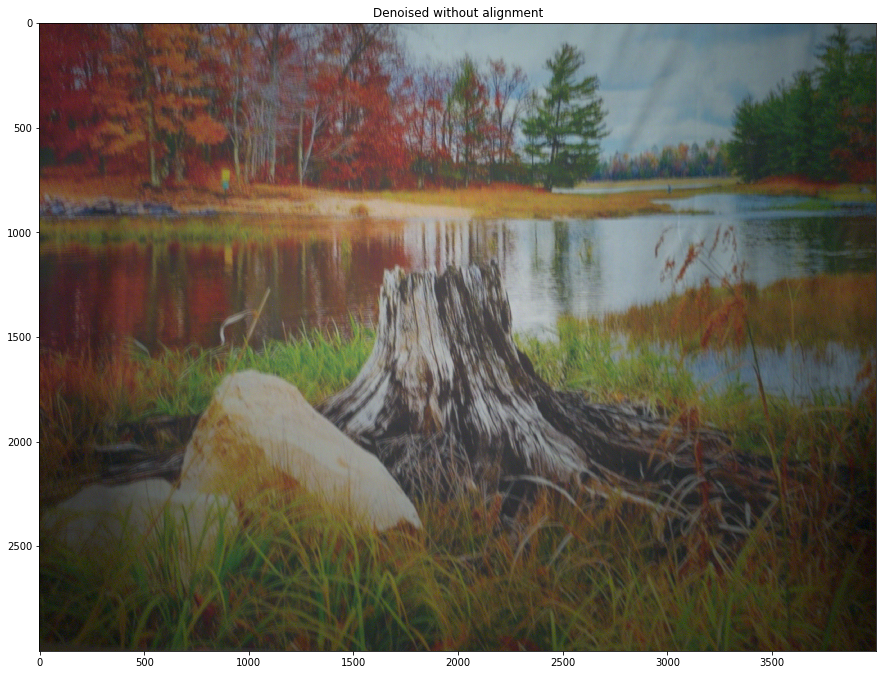

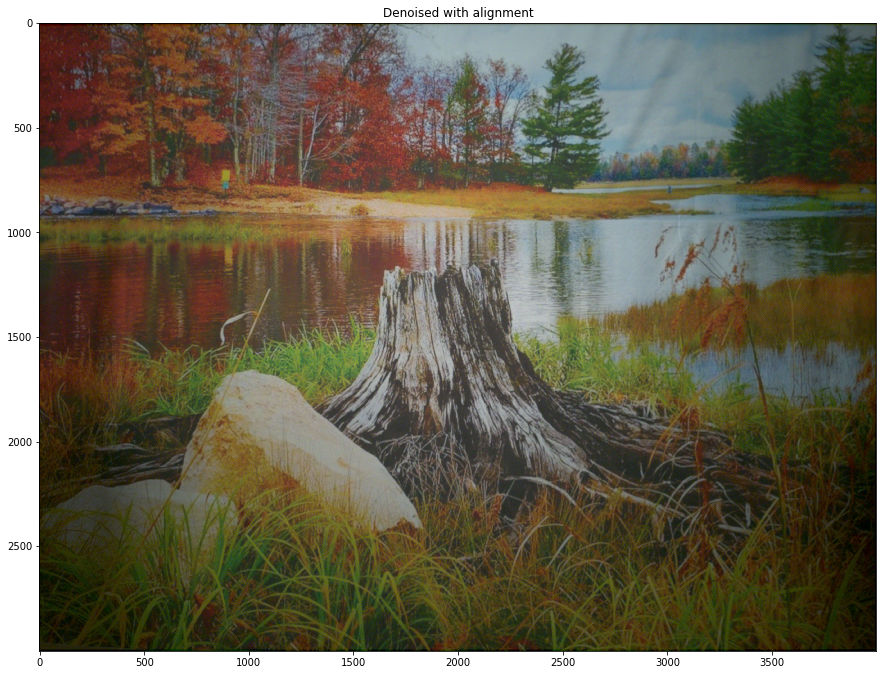

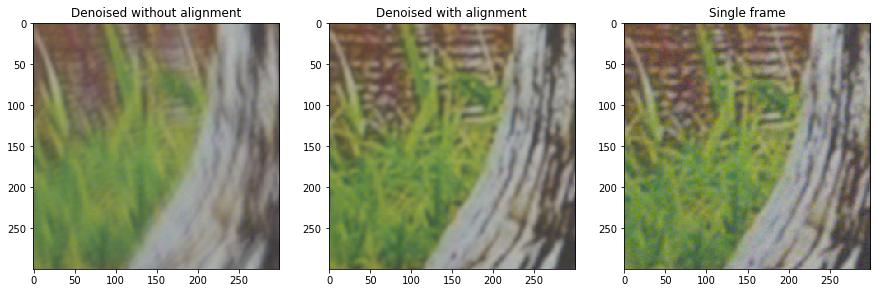

In [7]:
# Stack (no alignment)
image_folder = '../images/Scene2_handheld/Scene2_Bright/'
wb_gains = np.array(metadata['handheld']['bright']['wb'])
bl = metadata['handheld']['bright']['bl']
ccm = np.array(metadata['handheld']['bright']['ccm'])
img_stack = open_image_stack(image_folder, image_height, image_width)
rgb_stack = simple_isp(img_stack, False, bitdepth, bayer_pattern, bl, ccm, wb_method, wb_gains)

# Stack (alignment)
rgb_stack_aligned = simple_isp(img_stack, motion_comp, bitdepth, bayer_pattern, bl, ccm, wb_method, wb_gains)

# Single capture
rgb_single = simple_isp(img_stack[:, :, 0], motion_comp, bitdepth, bayer_pattern, bl, ccm, wb_method, wb_gains)

# Show the result
plt.figure(figsize = (15,15))
plt.imshow(rgb_stack)
plt.title('Denoised without alignment')
plt.figure(figsize = (15,15))
plt.imshow(rgb_stack_aligned)
plt.title('Denoised with alignment')

# Crop
idx = [1400, 1700, 1400, 1700]
plt.figure(figsize = (15,15))
plt.subplot(131)
plt.imshow(rgb_stack[idx[0]:idx[1], idx[2]:idx[3], :])
plt.title('Denoised without alignment')
plt.subplot(132)
plt.imshow(rgb_stack_aligned[idx[0]:idx[1], idx[2]:idx[3], :])
plt.title('Denoised with alignment')
plt.subplot(133)
plt.imshow(rgb_single[idx[0]:idx[1], idx[2]:idx[3], :])
plt.title('Single frame')

Observe how without motion compensation the image looks blurry and sharpness is improved after alignment.

#### Dark conditions

Text(0.5, 1.0, 'Single frame')

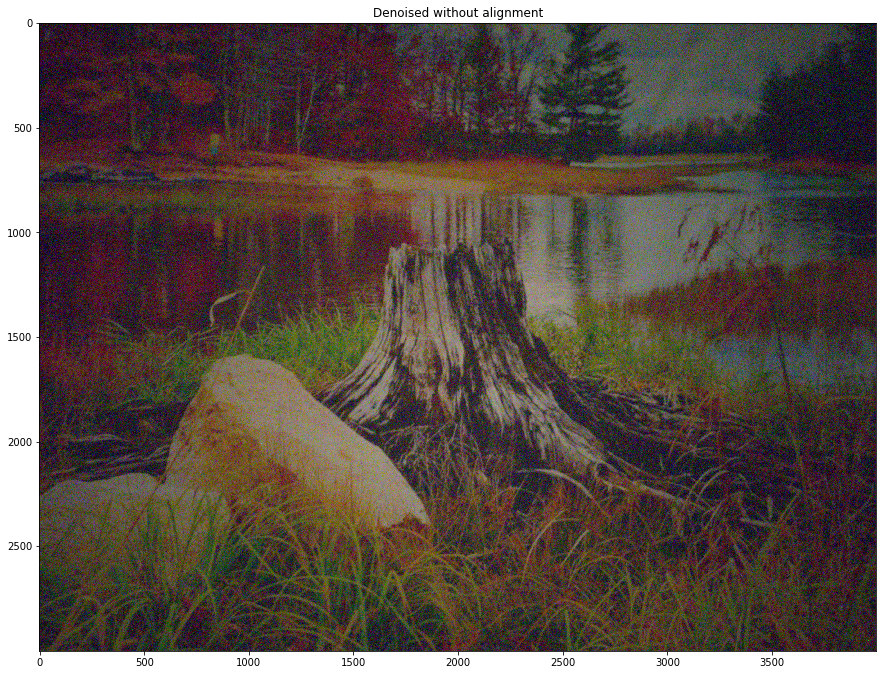

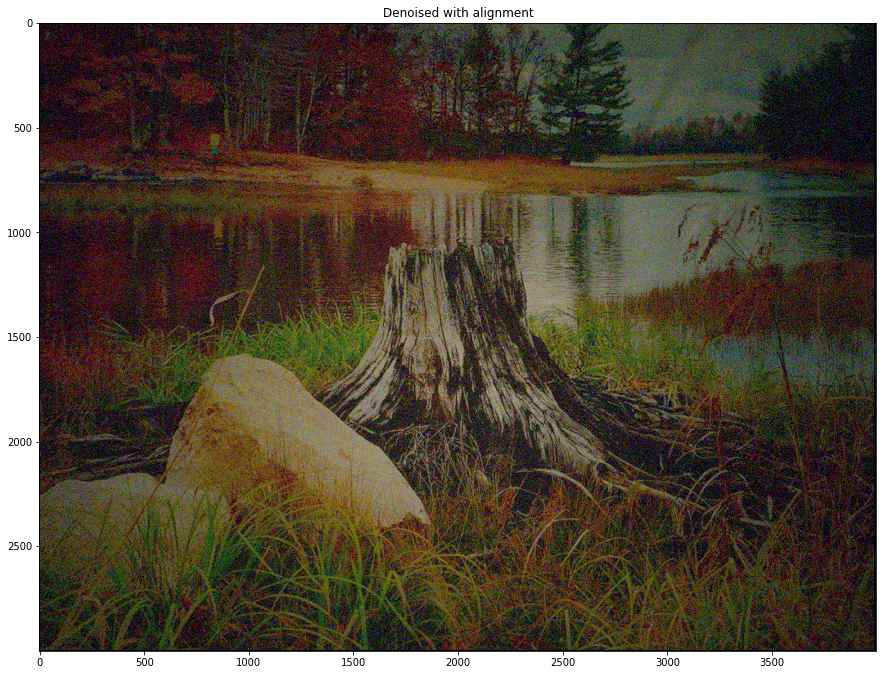

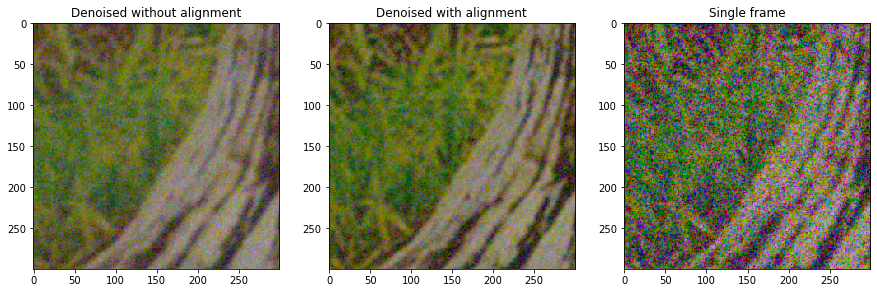

In [8]:
# Stack (no alignment)
image_folder = '../images/Scene2_handheld/Scene2_Dark/'
wb_gains = np.array(metadata['handheld']['dark']['wb'])
bl = metadata['handheld']['dark']['bl']
ccm = np.array(metadata['handheld']['dark']['ccm'])
img_stack = open_image_stack(image_folder, image_height, image_width)
rgb_stack = simple_isp(img_stack, False, bitdepth, bayer_pattern, bl, ccm, wb_method, wb_gains)

# Stack (alignment)
rgb_stack_aligned = simple_isp(img_stack, motion_comp, bitdepth, bayer_pattern, bl, ccm, wb_method, wb_gains)

# Single capture
rgb_single = simple_isp(img_stack[:, :, 0], motion_comp, bitdepth, bayer_pattern, bl, ccm, wb_method, wb_gains)

# Show the result
plt.figure(figsize = (15,15))
plt.imshow(rgb_stack * 2)
plt.title('Denoised without alignment')
plt.figure(figsize = (15,15))
plt.imshow(rgb_stack_aligned * 2)
plt.title('Denoised with alignment')

# Crop
idx = [1400, 1700, 1400, 1700]
plt.figure(figsize = (15,15))
plt.subplot(131)
plt.imshow(rgb_stack[idx[0]:idx[1], idx[2]:idx[3], :] * 2)
plt.title('Denoised without alignment')
plt.subplot(132)
plt.imshow(rgb_stack_aligned[idx[0]:idx[1], idx[2]:idx[3], :] * 2)
plt.title('Denoised with alignment')
plt.subplot(133)
plt.imshow(rgb_single[idx[0]:idx[1], idx[2]:idx[3], :] * 2)
plt.title('Single frame')

NOTE 1: The images have been multiplied by 2 for visualization purposes as they are underexposed.

NOTE 2: As the frames are shifted in the horizontal and vertical directions, the border of the image will present areas of no data (assigned to 0 by the algorithm). Cropping these borders is then recommended and what all the cameras in the market do. This will reduce the effective resolution of the final image.

## Task 3
The parameter files provide AWB obtained from camera, but it may not be correct for dark
scene. Please develop an algorithm to improve AWB and compare your results.

### Auto white balance (AWB)
There are several well-known AWB algorithms in the literature, including Grey World and MaxRGB. The problem of these traditional algorithms is that they don't consider the colorimetric characteristics of the camera capturing the images.

State-of-the-art results can be achieved by characterizing the response of the camera to different known light sources. For example, RAW images of a ColorChecker under different illuminants (A, F11, D50, D65, etc.) can be captured inside a light booth and the relationship between the red/green and blue/green channel responses are then used to generate a Planckian curve that constrains the possible WB corrections that the ISP can apply. Most modern techniques use deep learning, where again, RAW data captured by a given camera allows the neural network to predict the illuminant from any input RAW image.

In this assignment, we have no information about the scene light source nor about the colorimetric characteristics of the camera, restricting our possible algorithms to generic algorithms with limited performance. We will try to improve the result of the default WB with two algorithms: Grey World and Grey Edge.

#### Bright conditions

Text(0.5, 1.0, 'Grey Edge')

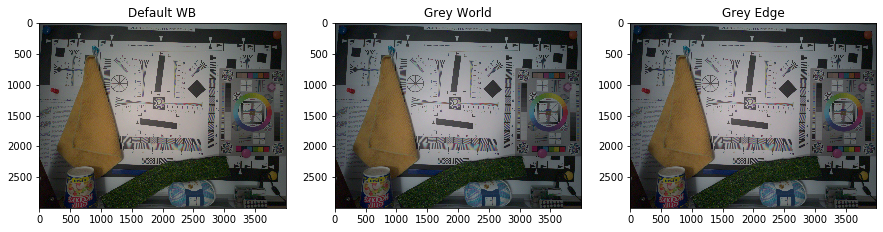

In [9]:
motion_comp = False

# Default WB
image_folder = '../images/Scene1_tripod/Scene1_Bright/'
wb_method = 'manual'
wb_gains = np.array(metadata['tripod']['bright']['wb'])
bl = metadata['tripod']['bright']['bl']
ccm = np.array(metadata['tripod']['bright']['ccm'])
img_stack = open_image_stack(image_folder, image_height, image_width)
rgb_stack_wb_default = simple_isp(img_stack, motion_comp, bitdepth, bayer_pattern, bl, ccm, wb_method, wb_gains)

# Grey World
wb_method = 'greyworld'
wb_bl = 0
wb_wl = 900
rgb_stack_wb_gw = simple_isp(img_stack, motion_comp, bitdepth, bayer_pattern, bl, ccm, wb_method, wb_gains, wb_bl, wb_wl)

# Grey Edge
wb_method = 'greyedge'
wb_bl = 0
wb_wl = 900
wb_sigma = 4
wb_grad_order = 1
wb_norm = 2
rgb_stack_wb_ge = simple_isp(img_stack, motion_comp, bitdepth, bayer_pattern, bl, ccm, wb_method, wb_gains, wb_bl, wb_wl, wb_sigma, wb_grad_order, wb_norm)

# Show the result
plt.figure(figsize = (15,15))
plt.subplot(131)
plt.imshow(rgb_stack_wb_default)
plt.title('Default WB')
plt.subplot(132)
plt.imshow(rgb_stack_wb_gw)
plt.title('Grey World')
plt.subplot(133)
plt.imshow(rgb_stack_wb_ge)
plt.title('Grey Edge')


As we can see, the two algorithms proposed manage to remove the yellowish colour cast present with the default WB.

NOTE: The WB algorithms implemented depend on several parameters, so tuning is necessary to make them work in a diverse set of conditions. The parameters set in this example are only a possible combination. Fine-tuning is likely to arrive at better results.

Text(0.5, 1.0, 'Grey Edge')

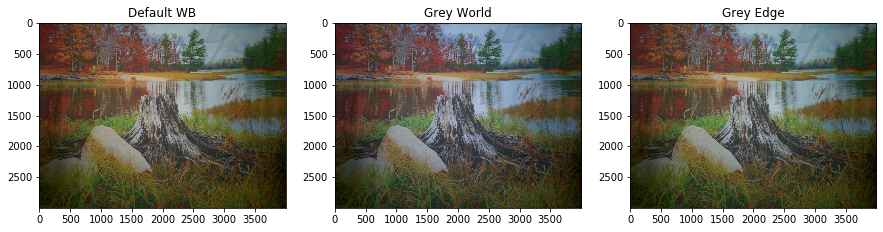

In [10]:
motion_comp = True

# Default WB
image_folder = '../images/Scene2_handheld/Scene2_Bright/'
wb_method = 'manual'
wb_gains = np.array(metadata['handheld']['bright']['wb'])
bl = metadata['handheld']['bright']['bl']
ccm = np.array(metadata['handheld']['bright']['ccm'])
img_stack = open_image_stack(image_folder, image_height, image_width)
rgb_stack_wb_default = simple_isp(img_stack, motion_comp, bitdepth, bayer_pattern, bl, ccm, wb_method, wb_gains)

# Grey World
wb_method = 'greyworld'
wb_bl = 0
wb_wl = 900
rgb_stack_wb_gw = simple_isp(img_stack, motion_comp, bitdepth, bayer_pattern, bl, ccm, wb_method, wb_gains, wb_bl, wb_wl)

# Grey Edge
wb_method = 'greyedge'
wb_bl = 0
wb_wl = 900
wb_sigma = 4
wb_grad_order = 1
wb_norm = 2
rgb_stack_wb_ge = simple_isp(img_stack, motion_comp, bitdepth, bayer_pattern, bl, ccm, wb_method, wb_gains, wb_bl, wb_wl, wb_sigma, wb_grad_order, wb_norm)

# Show the result
plt.figure(figsize = (15,15))
plt.subplot(131)
plt.imshow(rgb_stack_wb_default)
plt.title('Default WB')
plt.subplot(132)
plt.imshow(rgb_stack_wb_gw)
plt.title('Grey World')
plt.subplot(133)
plt.imshow(rgb_stack_wb_ge)
plt.title('Grey Edge')

Since we don't have any information about the light source illuminating the scene, it is difficult to tell which algorithm performs best. However, we can refer to memory colours like the colour of the sky and the grass to evaluate how "natural" colours look like. For instance, the Grey World approach renders the most bluish sky followed by Grey Edge.

#### Dark conditions

Text(0.5, 1.0, 'Grey Edge')

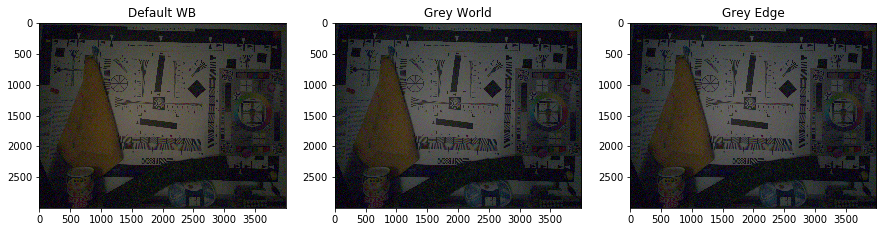

In [11]:
motion_comp = False

# Default WB
image_folder = '../images/Scene1_tripod/Scene1_Dark/'
wb_method = 'manual'
wb_gains = np.array(metadata['tripod']['dark']['wb'])
bl = metadata['tripod']['dark']['bl']
ccm = np.array(metadata['tripod']['dark']['ccm'])
img_stack = open_image_stack(image_folder, image_height, image_width)
rgb_stack_wb_default = simple_isp(img_stack, motion_comp, bitdepth, bayer_pattern, bl, ccm, wb_method, wb_gains)

# Grey World
wb_method = 'greyworld'
wb_bl = 0
wb_wl = 900
rgb_stack_wb_gw = simple_isp(img_stack, motion_comp, bitdepth, bayer_pattern, bl, ccm, wb_method, wb_gains, wb_bl, wb_wl)

# Grey Edge
wb_method = 'greyedge'
wb_bl = 0
wb_wl = 900
wb_sigma = 4
wb_grad_order = 1
wb_norm = 1
rgb_stack_wb_ge = simple_isp(img_stack, motion_comp, bitdepth, bayer_pattern, bl, ccm, wb_method, wb_gains, wb_bl, wb_wl, wb_sigma, wb_grad_order, wb_norm)

# Show the result
plt.figure(figsize = (15,15))
plt.subplot(131)
plt.imshow(rgb_stack_wb_default)
plt.title('Default WB')
plt.subplot(132)
plt.imshow(rgb_stack_wb_gw)
plt.title('Grey World')
plt.subplot(133)
plt.imshow(rgb_stack_wb_ge)
plt.title('Grey Edge')


Again, the two algorithms seem to outperform the default WB settings by removing the yellowish colour cast.

Text(0.5, 1.0, 'Grey Edge')

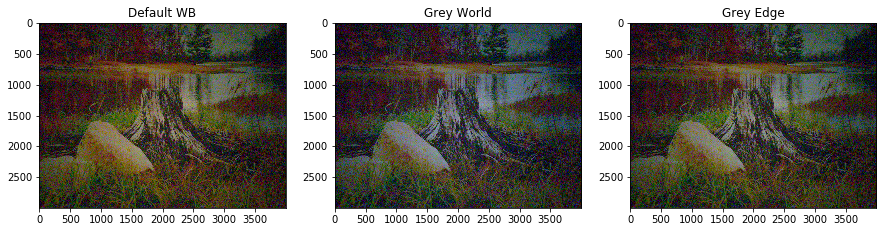

In [12]:
motion_comp = True

# Default WB
image_folder = '../images/Scene2_handheld/Scene2_Dark/'
wb_method = 'manual'
wb_gains = np.array(metadata['handheld']['dark']['wb'])
bl = metadata['handheld']['dark']['bl']
ccm = np.array(metadata['handheld']['dark']['ccm'])
img_stack = open_image_stack(image_folder, image_height, image_width)
rgb_stack_wb_default = simple_isp(img_stack, motion_comp, bitdepth, bayer_pattern, bl, ccm, wb_method, wb_gains)

# Grey World
wb_method = 'greyworld'
wb_bl = 0
wb_wl = 900
rgb_stack_wb_gw = simple_isp(img_stack, motion_comp, bitdepth, bayer_pattern, bl, ccm, wb_method, wb_gains, wb_bl, wb_wl)

# Grey Edge
wb_method = 'greyedge'
wb_bl = 0
wb_wl = 900
wb_sigma = 2
wb_grad_order = 2
wb_norm = 1
rgb_stack_wb_ge = simple_isp(img_stack, motion_comp, bitdepth, bayer_pattern, bl, ccm, wb_method, wb_gains, wb_bl, wb_wl, wb_sigma, wb_grad_order, wb_norm)

# Show the result
plt.figure(figsize = (15,15))
plt.subplot(131)
plt.imshow(rgb_stack_wb_default * 2)
plt.title('Default WB')
plt.subplot(132)
plt.imshow(rgb_stack_wb_gw * 2)
plt.title('Grey World')
plt.subplot(133)
plt.imshow(rgb_stack_wb_ge * 2)
plt.title('Grey Edge')

As in high light conditions for this same scene, Grey World seems to outperform the other two methods.

NOTE: The images have been multiplied by 2 for visualization purposes as they are underexposed.